### 1. InceptionResnetV2를 백본으로 사용,   dropout, BN 등 사용,    
### Epoch 10.

### 2. 임의로 구성한 백본,   인식률이 낮은편 


In [1]:
import tensorflow as tf
print(tf.__version__)

2.2.0


### Step 1. Dataset Download

In [2]:
import tensorflow_datasets as tfds


In [3]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)

In [4]:
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


### step2 .Dataset type transform to modelling

In [5]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

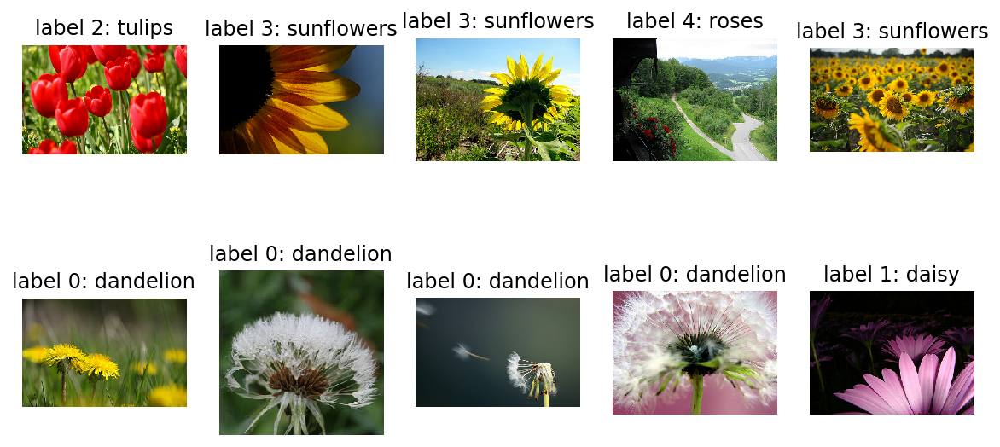

In [6]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [7]:
IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [8]:
import tensorflow as tf

train_batches = raw_train.map(format_example)
validation_batches = raw_validation.map(format_example)
test_batches = raw_test.map(format_example)

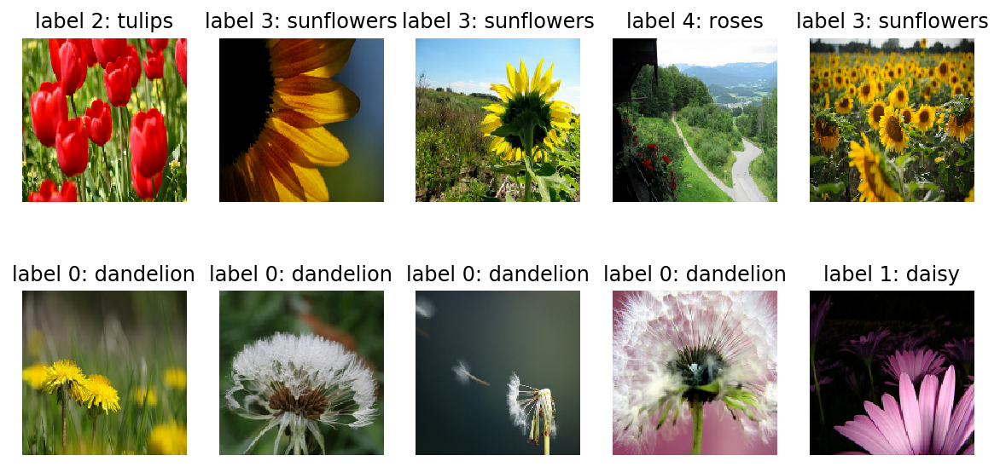

In [9]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train_batches.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

### step3 Backbone Model planning

In [10]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [11]:
train_batches = train_batches.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation_batches.batch(BATCH_SIZE)
test_batches = test_batches.batch(BATCH_SIZE)

In [12]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
# base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
#                                          include_top=False,
#                                          weights='imagenet')

base_model = tf.keras.applications.InceptionResNetV2(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')



In [13]:
base_model.trainable = False

In [14]:
for image_batch, label_batch in train_batches.take(32):
    pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [15]:
#  모델 구조
base_model.summary()

Model: "inception_resnet_v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 79, 79, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 79, 79, 32)   96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 79, 79, 32)   0           batch_normalization[0][0]        
________________________________________________________________________________

In [16]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [17]:
feature_batch = base_model(image_batch)
feature_batch.shape # 5*5 사이즈 작아지고 512 채널확장

TensorShape([32, 3, 3, 1536])

In [18]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [19]:
# global pooling 에 feature_batch 입력.
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 1536)


In [20]:
dense_layer = tf.keras.layers.Dense(512, activation='relu')
dropout_layer = tf.keras.layers.Dropout(0.2)
bn_layer = tf.keras.layers.BatchNormalization( axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True,
    beta_initializer='zeros', gamma_initializer='ones',
    moving_mean_initializer='zeros', moving_variance_initializer='ones',
    beta_regularizer=None, gamma_regularizer=None, beta_constraint=None,
    gamma_constraint=None, renorm=False, renorm_clipping=None, renorm_momentum=0.99,
    fused=None, trainable=True)
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 5)


In [21]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  dropout_layer,
  bn_layer,
  prediction_layer
])

In [22]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_resnet_v2 (Model)  (None, 3, 3, 1536)        54336736  
_________________________________________________________________
global_average_pooling2d (Gl (None, 1536)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               786944    
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
batch_normalization_203 (Bat (None, 512)               2048      
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 2565      
Total params: 55,128,293
Trainable params: 790,533
Non-trainable params: 54,337,760
______________________________________

In [23]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [24]:
validation_steps=5
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

5/5 [==============================] - 1s 299ms/step - loss: 2.7679 - accuracy: 0.2250
initial loss: 2.77
initial accuracy: 0.22


In [25]:
EPOCHS = 10  # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 41s 443ms/step - loss: 0.8398 - accuracy: 0.6969 - val_loss: 0.4853 - val_accuracy: 0.8256
Epoch 2/10
92/92 [==============================] - 41s 443ms/step - loss: 0.5218 - accuracy: 0.8113 - val_loss: 0.4578 - val_accuracy: 0.8392
Epoch 3/10
92/92 [==============================] - 42s 453ms/step - loss: 0.4122 - accuracy: 0.8529 - val_loss: 0.4445 - val_accuracy: 0.8365
Epoch 4/10
92/92 [==============================] - 42s 455ms/step - loss: 0.3453 - accuracy: 0.8699 - val_loss: 0.3906 - val_accuracy: 0.8692
Epoch 5/10
92/92 [==============================] - 42s 459ms/step - loss: 0.2956 - accuracy: 0.8982 - val_loss: 0.3748 - val_accuracy: 0.8774
Epoch 6/10
92/92 [==============================] - 41s 444ms/step - loss: 0.2494 - accuracy: 0.9162 - val_loss: 0.3746 - val_accuracy: 0.8719
Epoch 7/10
92/92 [==============================] - 41s 442ms/step - loss: 0.2143 - accuracy: 0.9292 - val_loss: 0.3739 - val_accuracy: 0.8638

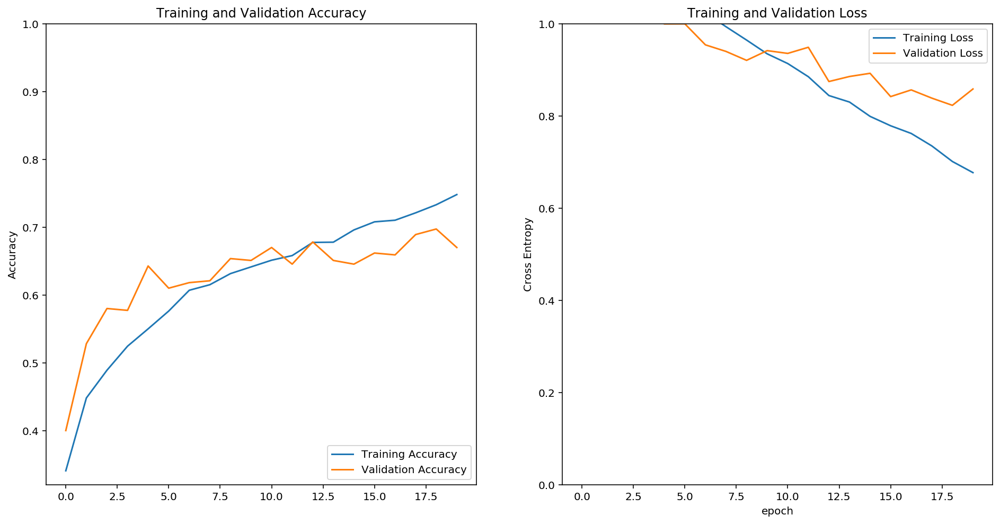

In [62]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [26]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions
#  0과 1 사이의 값으로 확률값을 출력하였습니다.


array([[1.57895801e-03, 4.34875339e-02, 8.15926075e-01, 1.53146423e-02,
        1.23692706e-01],
       [9.99767840e-01, 4.60391420e-05, 4.15347895e-05, 1.38394782e-04,
        6.29860142e-06],
       [2.73560941e-01, 2.95182603e-04, 1.30273784e-02, 7.06364810e-01,
        6.75163744e-03],
       [2.73618323e-04, 2.47444417e-02, 9.11115766e-01, 2.50012358e-03,
        6.13660291e-02],
       [9.86452222e-01, 1.04145259e-02, 5.69668424e-04, 1.04881288e-03,
        1.51488476e-03],
       [9.99504328e-01, 2.67948926e-04, 7.59933901e-05, 8.06570097e-06,
        1.43518089e-04],
       [1.64174766e-04, 1.56508305e-03, 9.92279053e-01, 5.04513737e-03,
        9.46537242e-04],
       [2.02403888e-02, 8.75876173e-02, 5.87778515e-04, 8.91316175e-01,
        2.68022501e-04],
       [1.45157855e-02, 1.95750548e-03, 6.31394148e-01, 3.44079077e-01,
        8.05346854e-03],
       [9.99411583e-01, 1.54859052e-04, 8.83097746e-05, 3.21077445e-04,
        2.41584639e-05],
       [9.93786693e-01, 3.0230

In [27]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 3, 2, 0, 0, 2, 3, 2, 0, 0, 0, 0, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       0, 0, 1, 3, 1, 2, 2, 3, 0, 4])

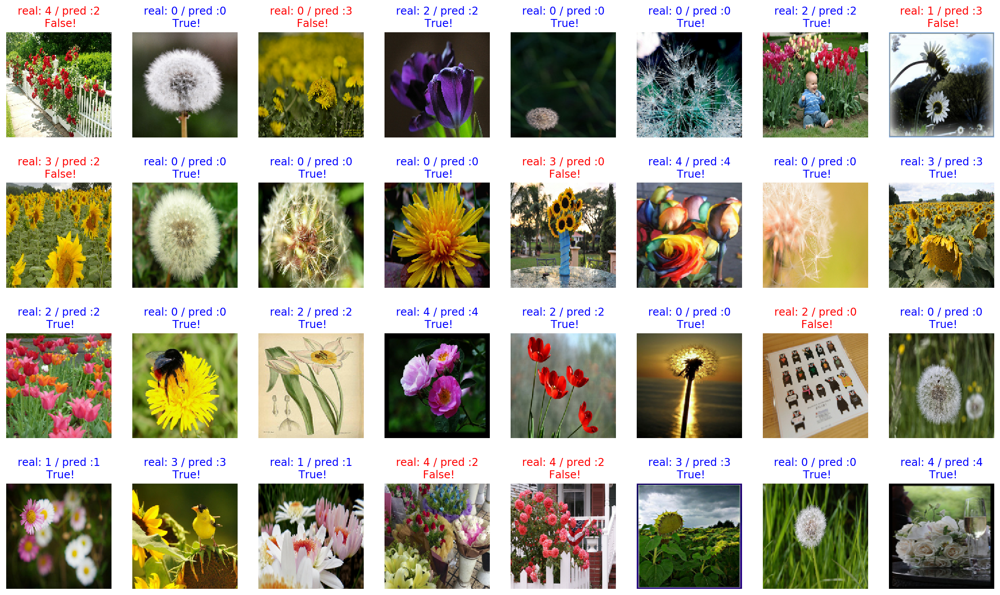

In [28]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [29]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외


75.0


In [30]:
import os

checkpoint_dir = os.getenv("HOME") + "/cat_vs_dog/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


In [31]:
# 이미지를 폴더에 
img_dir_path = os.getenv("HOME") + "/cat_vs_dog/images"
os.path.exists(img_dir_path)

True

In [32]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

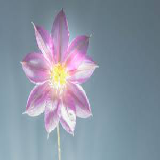

In [33]:
IMG_SIZE = 160
flower_image_path = os.path.join(img_dir_path, 'my_flower.jpeg')

flower_image = load_img(flower_image_path, target_size=(IMG_SIZE, IMG_SIZE))
flower_image

In [34]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    f1_percentage = round(prediction[0] * 100)
    f2_percentage = round(prediction[1] * 100)
    f3_percentage = round(prediction[2] * 100)
    f4_percentage = round(prediction[3] * 100)
    f5_percentage = round(prediction[4] * 100)

    
    
    
    print(f"This image seems \n{f1_percentage}% f1,and \n{f2_percentage}% f2,and \n{f3_percentage}% f3, and \n{f4_percentage}% f4, and \n{f5_percentage}% f5")
          

This image seems 
0.0% f1,and 
0.0% f2,and 
0.0% f3, and 
0.0% f4, and 
100.0% f5


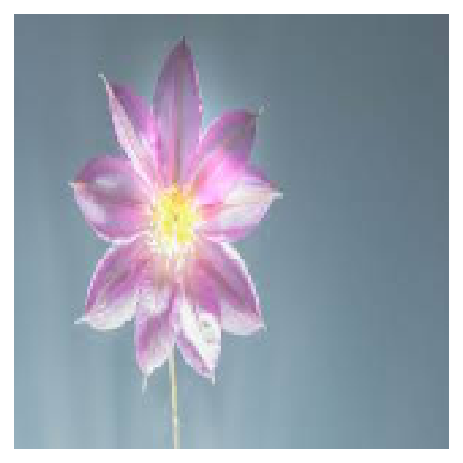

In [35]:
filename = 'my_flower.jpeg'

show_and_predict_image(img_dir_path, filename)

This image seems 
0.0% f1,and 
0.0% f2,and 
0.0% f3, and 
0.0% f4, and 
100.0% f5


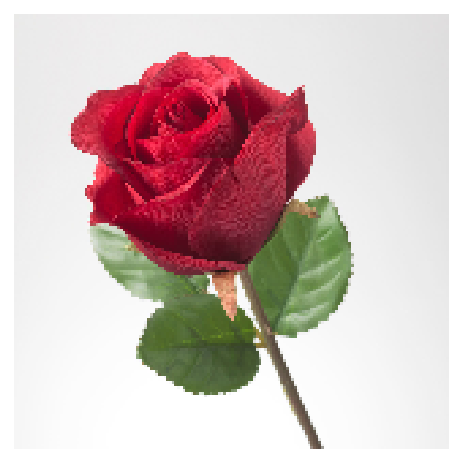

In [36]:
filename = 'my_flower2.jpeg'

show_and_predict_image(img_dir_path, filename)

This image seems 
0.0% f1,and 
0.0% f2,and 
0.0% f3, and 
0.0% f4, and 
100.0% f5


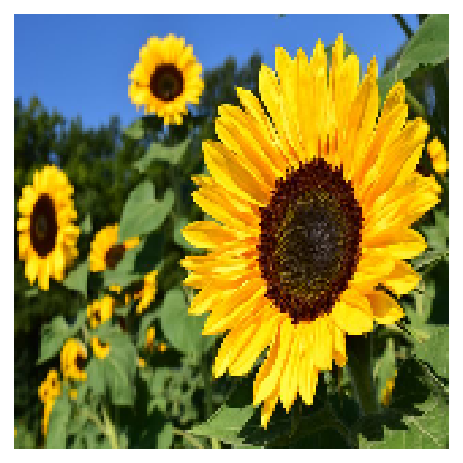

In [37]:
filename = 'my_flower3.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 
0.0% f1,and 
0.0% f2,and 
0.0% f3, and 
0.0% f4, and 
100.0% f5


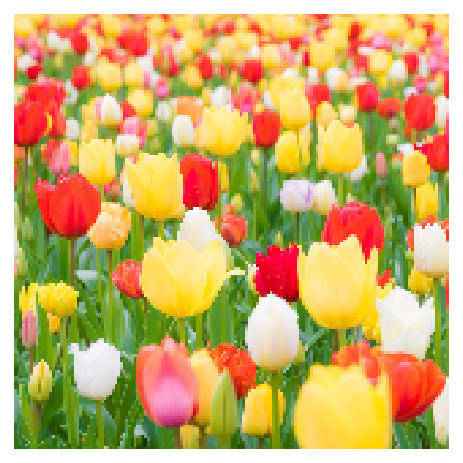

In [38]:
filename = 'my_flower4.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 
0.0% f1,and 
0.0% f2,and 
0.0% f3, and 
0.0% f4, and 
100.0% f5


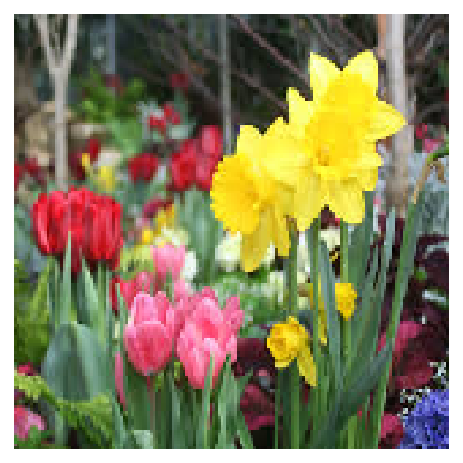

In [39]:
filename = 'my_flower5.jpeg'

show_and_predict_image(img_dir_path, filename)

### 백본을 불러서 사용하는 방법을 익힐수있었고, 
### 중간들어가는 drop out, BN, 등등을 넣어볼수있었다.
### 차후 새로운 백본이 나오면 적용해봐야겠음,.

### 한장의 꽃을 넣어서 무슨꽃인지 분류되는 확률을 구해보려했으나,
### 전부 5번째 꽃으로 인식한다 나중에 변경 해봐야할듯하다.

In [40]:
import tensorflow as tf
print(tf.__version__)

2.2.0


### Step 1. Dataset Download

In [41]:
import tensorflow_datasets as tfds


In [42]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)

In [43]:
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


### step2 .Dataset type transform to modelling

In [44]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

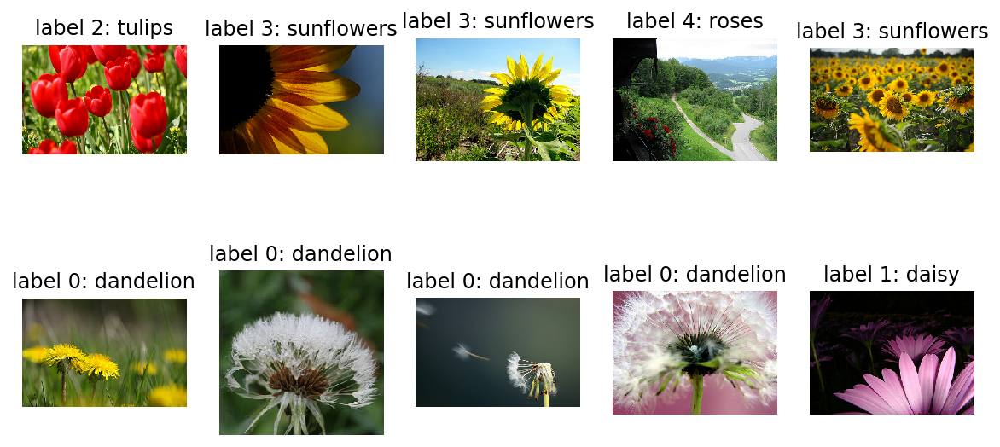

In [45]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [46]:
IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [47]:
import tensorflow as tf

train_batches = raw_train.map(format_example)
validation_batches = raw_validation.map(format_example)
test_batches = raw_test.map(format_example)


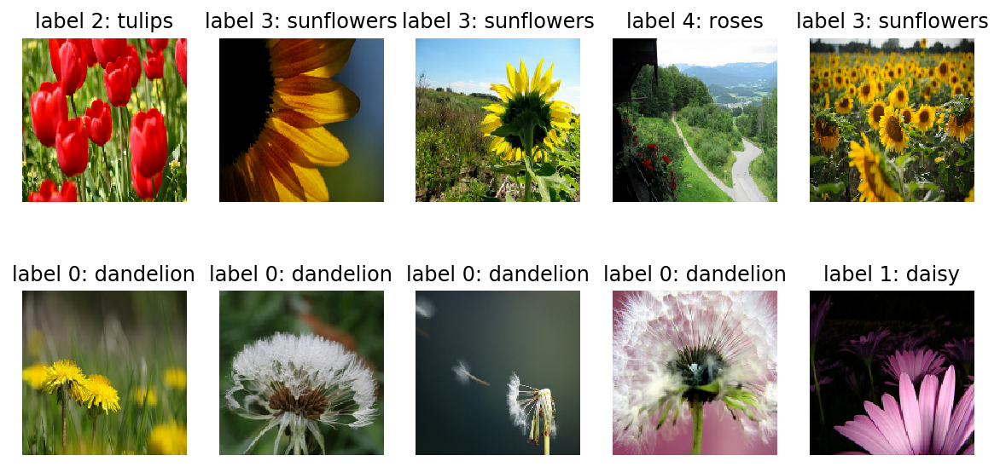

In [48]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train_batches.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

### Step3. Model Planning

In [49]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv2D, Flatten, MaxPooling2D

In [50]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    
    Conv2D(filters=128, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    
    Flatten(),
    
    Dense(units=128, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    Dense(units=16, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    Dense(units=5, activation='softmax')
])

In [51]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_203 (Conv2D)          (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_204 (Conv2D)          (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_205 (Conv2D)          (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
conv2d_206 (Conv2D)          (None, 20, 20, 128)      

In [52]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [53]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [54]:
train_batches = train_batches.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation_batches.batch(BATCH_SIZE)
test_batches = test_batches.batch(BATCH_SIZE)

In [55]:
for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [56]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

11/20 [===============>..............] - ETA: 0s - loss: 1.5997 - accuracy: 0.2472WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


12/20 [=================>............] - 0s 36ms/step - loss: 1.6009 - accuracy: 0.2452
initial loss: 1.60
initial accuracy: 0.25


In [57]:
EPOCHS = 20
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/20
92/92 [==============================] - 16s 176ms/step - loss: 1.4894 - accuracy: 0.3413 - val_loss: 1.3386 - val_accuracy: 0.4005
Epoch 2/20
92/92 [==============================] - 16s 174ms/step - loss: 1.3344 - accuracy: 0.4486 - val_loss: 1.1666 - val_accuracy: 0.5286
Epoch 3/20
92/92 [==============================] - 16s 175ms/step - loss: 1.2457 - accuracy: 0.4894 - val_loss: 1.0981 - val_accuracy: 0.5804
Epoch 4/20
92/92 [==============================] - 16s 179ms/step - loss: 1.1801 - accuracy: 0.5249 - val_loss: 1.0478 - val_accuracy: 0.5777
Epoch 5/20
92/92 [==============================] - 16s 177ms/step - loss: 1.1230 - accuracy: 0.5504 - val_loss: 0.9997 - val_accuracy: 0.6431
Epoch 6/20
92/92 [==============================] - 16s 175ms/step - loss: 1.0861 - accuracy: 0.5766 - val_loss: 0.9999 - val_accuracy: 0.6104
Epoch 7/20
92/92 [==============================] - 16s 174ms/step - loss: 1.0237 - accuracy: 0.6073 - val_loss: 0.9542 - val_accuracy: 0.6185

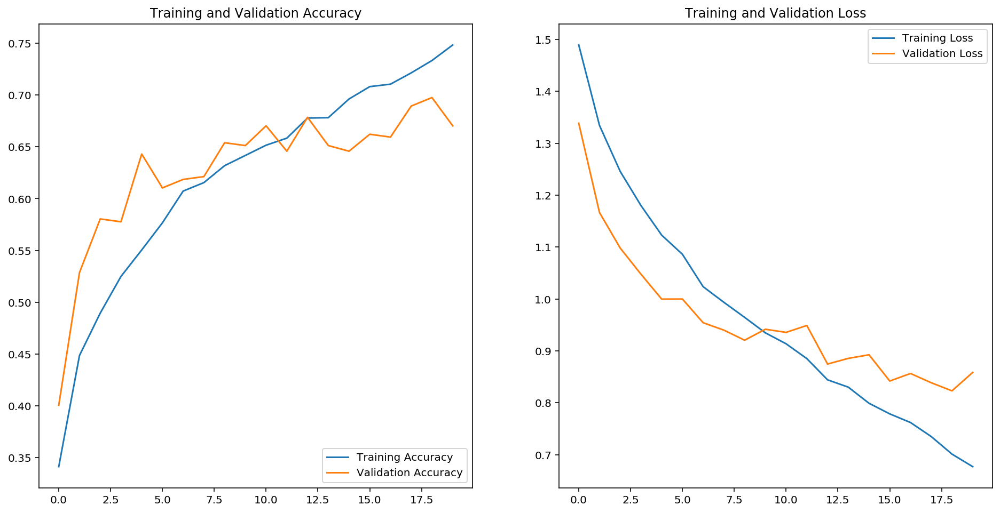

In [58]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [59]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[1.58575512e-02, 5.03754504e-02, 3.99731070e-01, 9.67896953e-02,
        4.37246263e-01],
       [9.77619529e-01, 1.10307243e-02, 9.22416989e-03, 6.63940387e-04,
        1.46164501e-03],
       [5.19773662e-01, 2.80742824e-01, 1.38812840e-01, 4.40576673e-02,
        1.66130308e-02],
       [1.15650356e-01, 7.43772909e-02, 3.80775124e-01, 2.61211395e-02,
        4.03076142e-01],
       [7.51992822e-01, 8.71450976e-02, 7.57471472e-02, 2.30031554e-02,
        6.21118248e-02],
       [4.05164391e-01, 2.02149138e-01, 1.28456339e-01, 5.97776957e-02,
        2.04452440e-01],
       [2.61014979e-03, 3.20123881e-02, 8.81528258e-01, 6.62378408e-03,
        7.72253424e-02],
       [3.56110930e-02, 5.51169455e-01, 1.59548000e-01, 2.96240300e-02,
        2.24047512e-01],
       [5.64343631e-02, 4.53297980e-03, 3.78841944e-02, 8.86135042e-01,
        1.50134722e-02],
       [9.89144504e-01, 2.82794447e-03, 5.94817940e-03, 6.19630096e-04,
        1.45969365e-03],
       [9.46434021e-01, 1.2080

In [60]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([4, 0, 0, 4, 0, 0, 2, 1, 3, 0, 0, 3, 3, 2, 0, 3, 2, 0, 1, 4, 2, 0,
       1, 0, 1, 1, 4, 4, 2, 1, 0, 0])

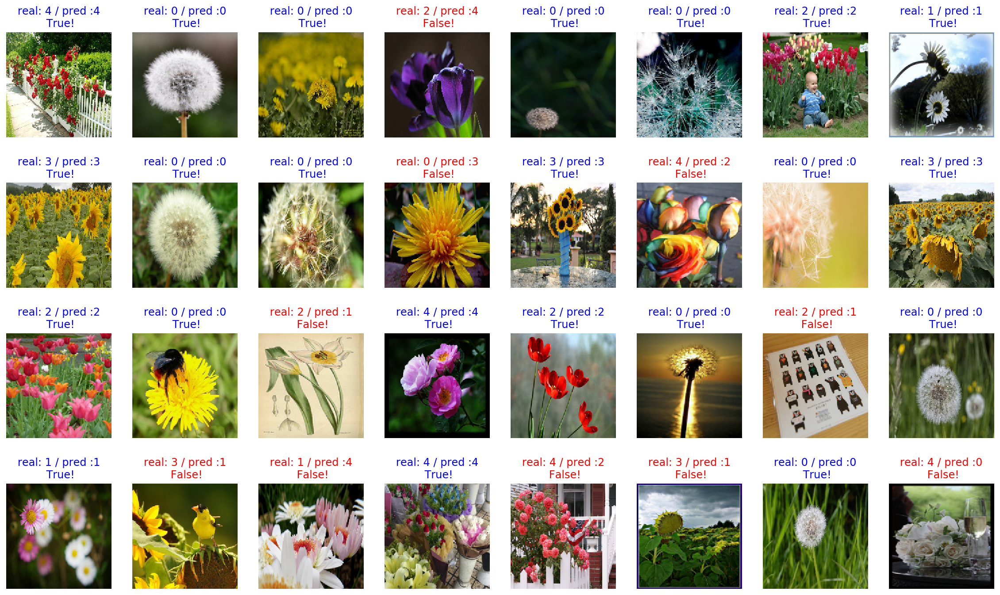

In [61]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [49]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    if label == prediction:
        count+=1
    # [[YOUR CODE]]


print(count / 32 * 100)    # 약 70% 내외

68.75


In [146]:
# 이미지를 폴더에 
img_dir_path = os.getenv("HOME") + "/cat_vs_dog/images"
os.path.exists(img_dir_path)

True

In [147]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

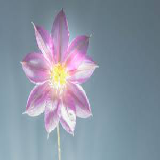

In [150]:
IMG_SIZE = 160
flower_image_path = os.path.join(img_dir_path, 'my_flower.jpeg')

flower_image = load_img(flower_image_path, target_size=(IMG_SIZE, IMG_SIZE))
flower_image

In [151]:
import os

checkpoint_dir = os.getenv("HOME") + "/cat_vs_dog/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


In [152]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")

This image seems 0.0% dog, and 0.0% cat.


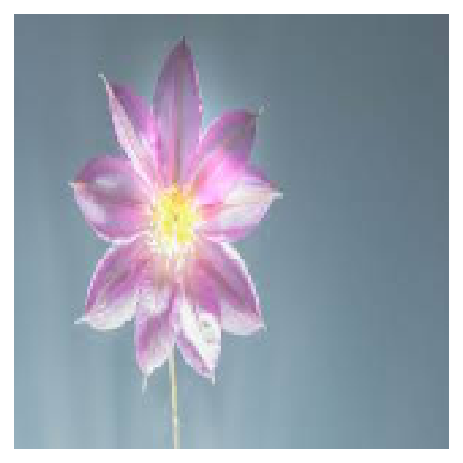

In [153]:
filename = 'my_flower.jpeg'

show_and_predict_image(img_dir_path, filename)

In [156]:
flower_image = img_to_array(flower_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
flower_image.shape # 이미지가 단 한장이라서 1 

(1, 160, 160, 3)

In [157]:
prediction = model.predict(dog_image)
prediction

array([[0., 0., 0., 0., 1.]], dtype=float32)

This image seems 0.0% dog, and 0.0% cat.


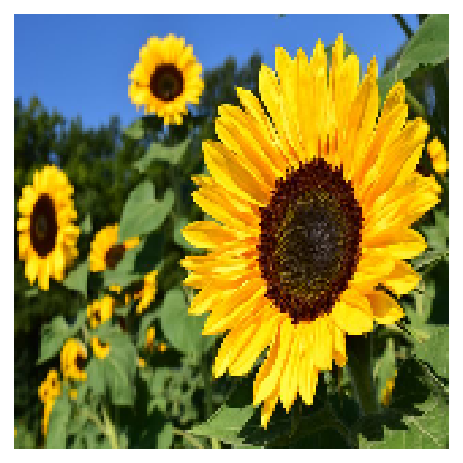

In [158]:
filename = 'my_flower3.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 0.0% dog, and 0.0% cat.


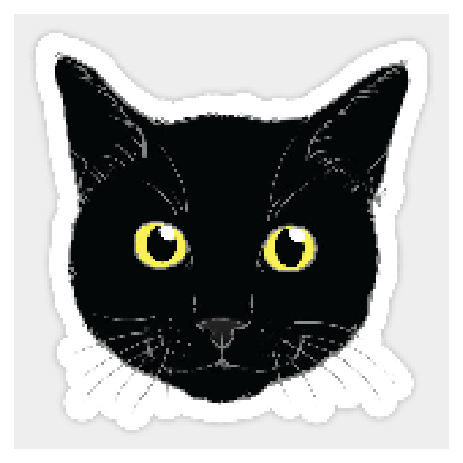

In [159]:
filename = "cat_face.jpg"
show_and_predict_image(img_dir_path, filename)

### 강아지 고양이 분류는 잘되는듯하다.
### 꽃사진을 넣었더니 강아지도 고양이도 아니라고 인식이 잘되는 편인듯하다.
### 학습데이터 사진에 일반고양이 사진만 있었던거같다...